In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!pwd

/content


In [ ]:
!ls /content/drive/MyDrive/sborniy_4/to_upload/

CrowdAnnotations.tsv   test_images	test_queries.csv   train_images
ExpertAnnotations.tsv  test_images.csv	train_dataset.csv


In [ ]:
!python -m spacy download en_core_web_md

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 17.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
# импортируем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import seaborn as sns
import os
import re
import spacy
import nltk
import tensorflow as tf

import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights
from torchvision import transforms
from sklearn.preprocessing import StandardScaler
from tqdm.notebook import tqdm
from PIL import Image
from sklearn.model_selection import GroupShuffleSplit
from transformers import AutoTokenizer, AutoModel
from tqdm.notebook import tqdm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from tensorflow.keras.layers import (Dense, BatchNormalization)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam


from nltk.corpus import stopwords
nltk.download('stopwords') # поддерживает удаление стоп-слов
nltk.download('punkt') # делит текст на список предложений



import warnings
warnings.simplefilter('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
# константы
SEED = 42
BATCH_SIZE = 32
IMG_SIDE_RESIZE = 224                                  # длина стороны изображения для ресайза
IMG_SIDE_CROP = 224                                    # длина стороны изображения для кропа
NORMALIZE_MEAN = [0.485, 0.456, 0.406]                 # mean values для нормализации изображений
NORMALIZE_STD = [0.229, 0.224, 0.225]                  # std values для нормализации изображений

PATH_IMAGES_TRAIN = '/content/drive/MyDrive/sborniy_4/to_upload/train_images'              # путь к основной папке с изображениями
PATH_IMAGES_TEST = '/content/drive/MyDrive/sborniy_4/to_upload/test_images'
PATH = '/content/drive/MyDrive/sborniy_4/to_upload'        # путь к данным
BLOCK = ['child', 'children', 'baby', 'babies', 'boy', 'girl', 'kid', 'infant', 'teenager', 'youth', 'newborn', 'schoolboy']

# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### Данные, полученные в результате опроса экспертов.

In [ ]:
df_expert = pd.read_csv('/content/drive/MyDrive/sborniy_4/to_upload/ExpertAnnotations.tsv',\
                        sep='\t',
                        header=0,
                        names=['image', 'query_id', 'first_grade', 'second_grade', 'third_grade'])

In [ ]:
# функция для первичного изучения датасета
def info(data):
    display(data.sample(10))
    display(data.info())
    display(data.describe().T)
    print('Количесвто дубликатов: ', data.duplicated().sum())
    print('Количесвто строк: ', data.shape[0], 'Количесвто столбцов: ', data.shape[1])

In [ ]:
# напишем функцию для отрисовки граффиков
def show_num_features(df, columns_title, num_bins):
    fig, axes = plt.subplots(nrows=2, figsize=(12, 8))
    axes[0].set_title(columns_title + ' плотность распределения', fontsize=20, loc='left')
    axes[0].set_ylabel('Плотность')
    axes[1].set_title(columns_title + ' boxplot', fontsize=20, loc='left')
    axes[1].set_ylabel('Значение')
    sns.histplot(df, bins=num_bins, ax=axes[0])
    sns.boxplot(df, ax=axes[1])
    plt.show()
    return

In [ ]:
info(df_expert)

,image,query_id,first_grade,second_grade,third_grade
4932,3696698390_989f1488e7.jpg,2831217847_555b2f95ca.jpg#2,1,2,2
3030,3110649716_c17e14670e.jpg,3458211052_bb73084398.jpg#2,1,1,2
2010,2675685200_0913d84d9b.jpg,339658315_fbb178c252.jpg#2,1,2,2
3245,3182121297_38c99b2769.jpg,2358561039_e215a8d6cd.jpg#2,1,2,2
1681,2534502836_7a75305655.jpg,246055693_ccb69ac5c6.jpg#2,2,2,3
5422,505929313_7668f021ab.jpg,452419961_6d42ab7000.jpg#2,1,1,1
5740,86412576_c53392ef80.jpg,1332722096_1e3de8ae70.jpg#2,1,1,1
5506,533713007_bf9f3e25b4.jpg,1174629344_a2e1a2bdbf.jpg#2,1,1,1
2672,2984174290_a915748d77.jpg,2901880865_3fd7b66a45.jpg#2,4,4,4
1650,2526041608_a9775ab8d7.jpg,1446053356_a924b4893f.jpg#2,1,2,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5821 entries, 0 to 5820
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image         5821 non-null   object
 1   query_id      5821 non-null   object
 2   first_grade   5821 non-null   int64 
 3   second_grade  5821 non-null   int64 
 4   third_grade   5821 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


None

,count,mean,std,min,25%,50%,75%,max
first_grade,5821.0,1.436695,0.787130,1.0,1.0,1.0,2.0,4.0
second_grade,5821.0,1.624463,0.856256,1.0,1.0,1.0,2.0,4.0
third_grade,5821.0,1.882151,0.904091,1.0,1.0,2.0,2.0,4.0


Количесвто дубликатов:  0
Количесвто строк:  5821 Количесвто столбцов:  5


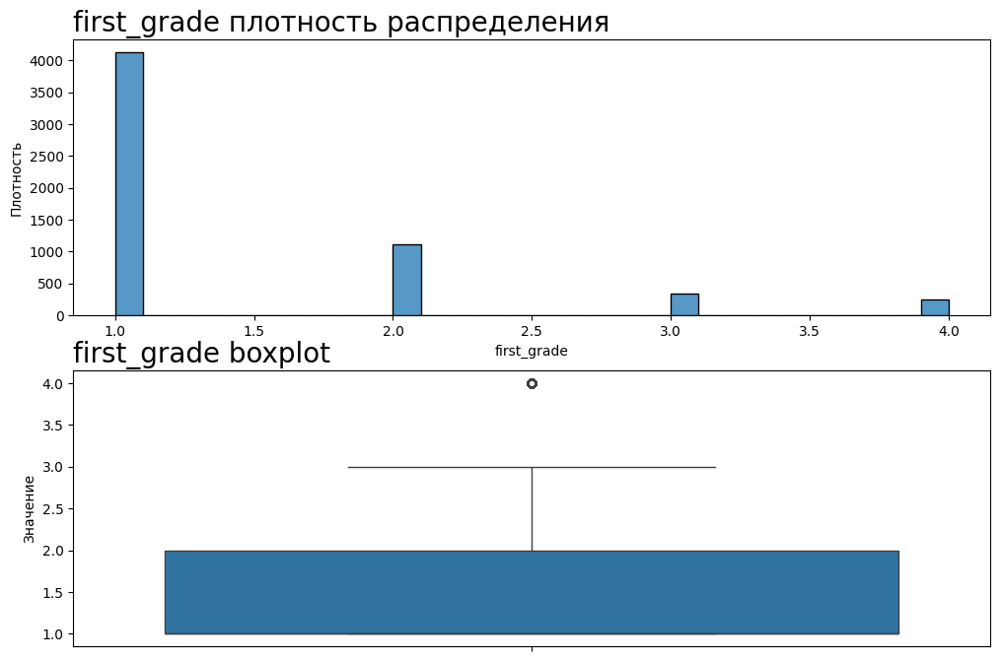

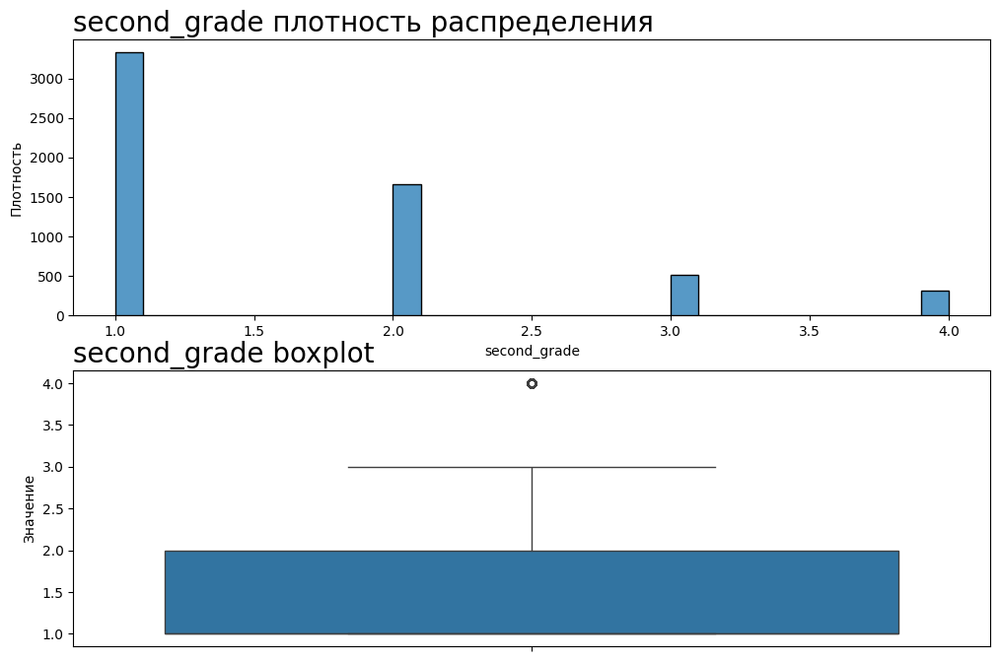

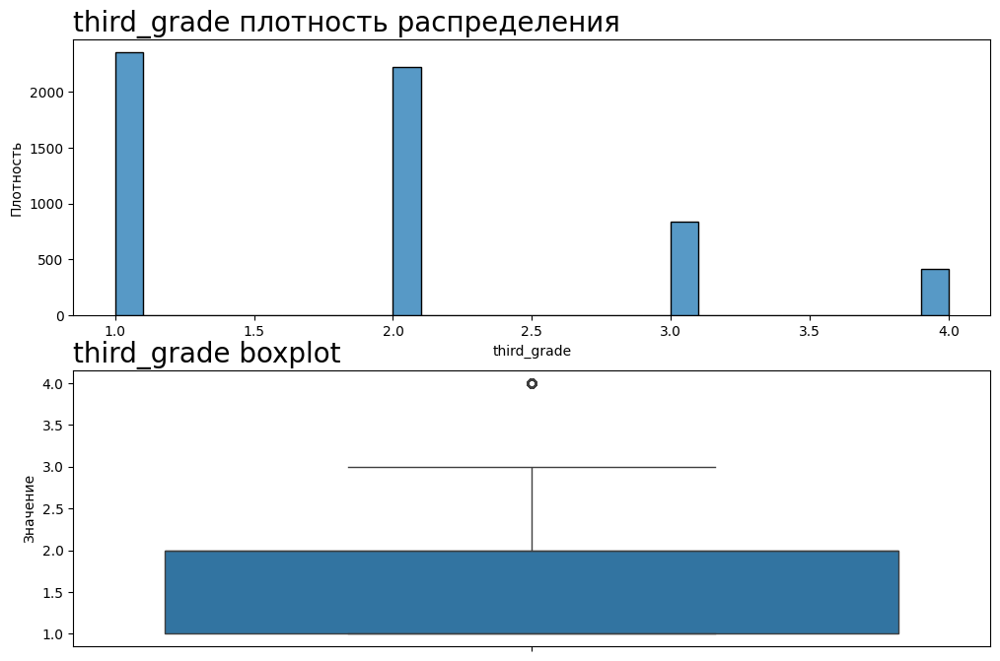

In [ ]:
# выделим чмисловые признаки
num_cols = df_expert.select_dtypes(exclude='object').columns.tolist()

# построим граффики
for col in df_expert[num_cols]:
    show_num_features(df_expert[col], col, num_bins=30)

__Вывод:__ Дубликаты отсутствуют. Файл содержит 5821 строку и 5 столбцов. Пропусков нет.

In [ ]:
df_expert['most_common_value'] = df_expert.mode(axis=1).iloc[:, 0]
display(df_expert.sample(5))

,image,query_id,first_grade,second_grade,third_grade,most_common_value
2137,2757803246_8aa3499d26.jpg,136552115_6dc3e7231c.jpg#2,1,1,1,1
1215,2345984157_724823b1e4.jpg,2830869109_c4e403eae6.jpg#2,1,1,1,1
785,2103568100_5d018c495b.jpg,997722733_0cb5439472.jpg#2,1,1,1,1
130,1267711451_e2a754b4f8.jpg,2723477522_d89f5ac62b.jpg#2,2,2,2,2
4005,3411393875_a9ff73c67a.jpg,444481722_690d0cadcf.jpg#2,2,2,2,2


In [ ]:
def categorize_grade(row):
    try:
        if row.most_common_value == 1:
            return 0
        elif row.most_common_value == 2:
            return 0.3
        elif row.most_common_value == 3:
            return 0.6
        elif row.most_common_value == 4:
            return 1
        else:
            return '3'
    except:
        pass

In [ ]:
def result_grade(df):
    df['result_grade'] = df.apply(categorize_grade, axis='columns')
    df['result_grade'] = df['result_grade'].astype('float')
    df = df.query('result_grade < 2')
    df.reset_index(inplace=True, drop=True)
    df_result = df.drop(['first_grade', 'second_grade', 'third_grade', 'most_common_value'], axis=1)
    return df_result

In [ ]:
df_expert_result = result_grade(df_expert)

In [ ]:
info(df_expert_result)

,image,query_id,result_grade
5143,461505235_590102a5bf.jpg,510531976_90bbee22a2.jpg#2,0.0
186,1322323208_c7ecb742c6.jpg,533483374_86c5d4c13e.jpg#2,0.3
1751,2588927489_f4da2f11ec.jpg,2247889670_413db8094b.jpg#2,0.0
3542,3259666643_ae49524c81.jpg,3259666643_ae49524c81.jpg#2,1.0
602,191003285_edd8d0cf58.jpg,1224851143_33bcdd299c.jpg#2,0.3
4912,373394550_1b2296b8c4.jpg,2623930900_b9df917b82.jpg#2,0.0
5490,56489627_e1de43de34.jpg,460935487_75b2da7854.jpg#2,0.0
916,2204550058_2707d92338.jpg,3250695024_93e8ab7305.jpg#2,0.0
2563,2944362789_aebbc22db4.jpg,3221036999_3f7b152d8a.jpg#2,0.6
1519,2484190118_e89363c465.jpg,3435035138_af32890a4c.jpg#2,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5695 entries, 0 to 5694
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5695 non-null   object 
 1   query_id      5695 non-null   object 
 2   result_grade  5695 non-null   float64
dtypes: float64(1), object(2)
memory usage: 133.6+ KB


None

,count,mean,std,min,25%,50%,75%,max
result_grade,5695.0,0.188938,0.273448,0.0,0.0,0.0,0.3,1.0


Количесвто дубликатов:  0
Количесвто строк:  5695 Количесвто столбцов:  3


In [ ]:
info(df_expert)

,image,query_id,first_grade,second_grade,third_grade,most_common_value,result_grade
320,1408958345_68eea9a4e4.jpg,260828892_7925d27865.jpg#2,3,3,4,3,0.6
3133,3141293960_74459f0a24.jpg,3609645320_815c294b65.jpg#2,1,1,1,1,0.0
149,127490019_7c5c08cb11.jpg,3562050678_4196a7fff3.jpg#2,1,1,2,1,0.0
3736,3310067561_b92017acab.jpg,2479652566_8f9fac8af5.jpg#2,1,1,1,1,0.0
5335,486917990_72bd4069af.jpg,485245061_5a5de43e20.jpg#2,1,1,2,1,0.0
3434,3222041930_f642f49d28.jpg,2480327661_fb69829f57.jpg#2,1,1,1,1,0.0
4476,3539767254_c598b8e6c7.jpg,3482062809_3b694322c4.jpg#2,1,1,1,1,0.0
4020,3421789737_f625dd17ed.jpg,2461616306_3ee7ac1b4b.jpg#2,1,2,2,2,0.3
929,2196846255_2c1635359a.jpg,2103568100_5d018c495b.jpg#2,2,2,2,2,0.3
1031,2238759450_6475641bdb.jpg,3484649669_7bfe62080b.jpg#2,1,2,2,2,0.3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5821 entries, 0 to 5820
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   image              5821 non-null   object 
 1   query_id           5821 non-null   object 
 2   first_grade        5821 non-null   int64  
 3   second_grade       5821 non-null   int64  
 4   third_grade        5821 non-null   int64  
 5   most_common_value  5821 non-null   object 
 6   result_grade       5821 non-null   float64
dtypes: float64(1), int64(3), object(3)
memory usage: 318.5+ KB


None

,count,mean,std,min,25%,50%,75%,max
first_grade,5821.0,1.436695,0.787130,1.0,1.0,1.0,2.0,4.0
second_grade,5821.0,1.624463,0.856256,1.0,1.0,1.0,2.0,4.0
third_grade,5821.0,1.882151,0.904091,1.0,1.0,2.0,2.0,4.0
result_grade,5821.0,0.249785,0.490436,0.0,0.0,0.0,0.3,3.0


Количесвто дубликатов:  0
Количесвто строк:  5821 Количесвто столбцов:  7


### Данные, полученные с помощью краудсорсинга

In [ ]:
df_crowd = pd.read_csv('/content/drive/MyDrive/sborniy_4/to_upload/CrowdAnnotations.tsv',\
                        sep='\t',
                        header=0,
                        names=['image', 'query_id', 'target', 'true', 'false'])

In [ ]:
info(df_crowd)

,image,query_id,target,true,false
21839,2971431335_e192613db4.jpg,3187395715_f2940c2b72.jpg#2,0.333333,1,2
40666,3692593096_fbaea67476.jpg,396360611_941e5849a3.jpg#2,0.000000,0,3
1868,1352410176_af6b139734.jpg,3673165148_67f217064f.jpg#2,0.000000,0,3
39679,3635577874_48ebaac734.jpg,2844641033_dab3715a99.jpg#2,0.000000,0,3
38416,3592968286_b63c81bcd2.jpg,3110649716_c17e14670e.jpg#2,0.000000,0,3
16539,2677656448_6b7e7702af.jpg,3498327617_d2e3db3ee3.jpg#2,0.000000,0,3
12240,2475162978_2c51048dca.jpg,263854883_0f320c1562.jpg#2,0.000000,0,3
26392,317109978_cb557802e1.jpg,3316725440_9ccd9b5417.jpg#2,0.000000,0,3
47684,96420612_feb18fc6c6.jpg,3686924335_3c51e8834a.jpg#2,0.000000,0,3
24282,3085667865_fa001816be.jpg,2950905787_f2017d3e49.jpg#2,0.000000,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47829 entries, 0 to 47828
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47829 non-null  object 
 1   query_id  47829 non-null  object 
 2   target    47829 non-null  float64
 3   true      47829 non-null  int64  
 4   false     47829 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None

,count,mean,std,min,25%,50%,75%,max
target,47829.0,0.068766,0.207490,0.0,0.0,0.0,0.0,1.0
true,47829.0,0.208430,0.628775,0.0,0.0,0.0,0.0,5.0
false,47829.0,2.820214,0.656556,0.0,3.0,3.0,3.0,6.0


Количесвто дубликатов:  0
Количесвто строк:  47829 Количесвто столбцов:  5


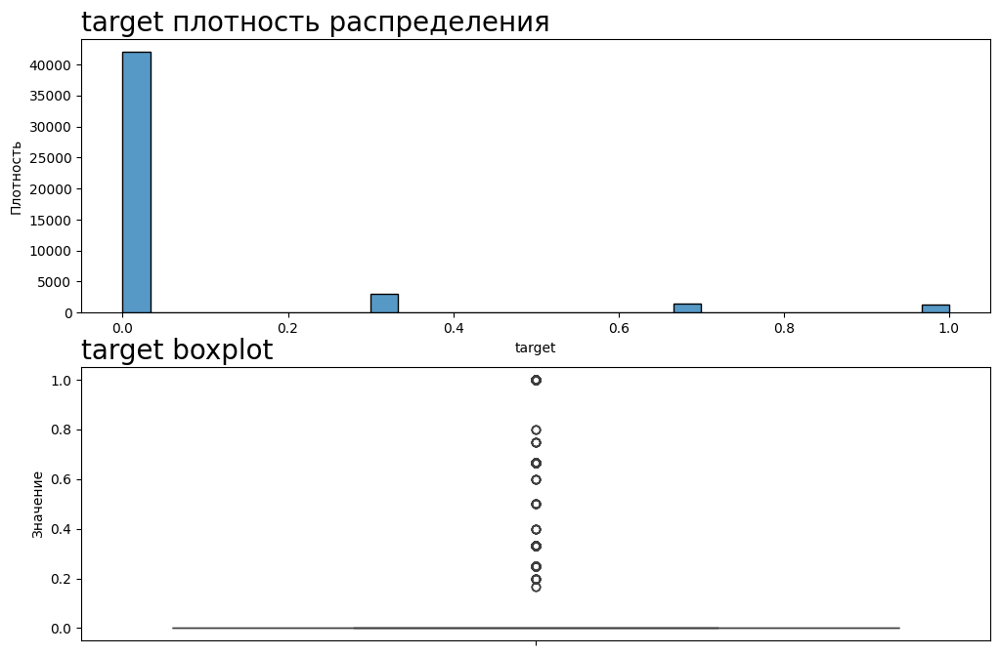

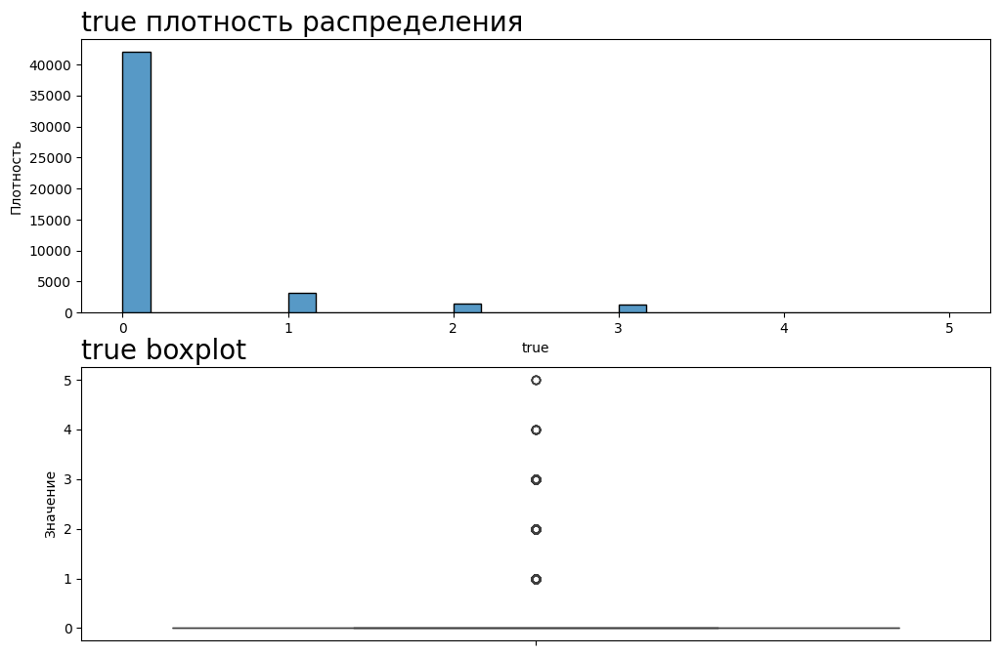

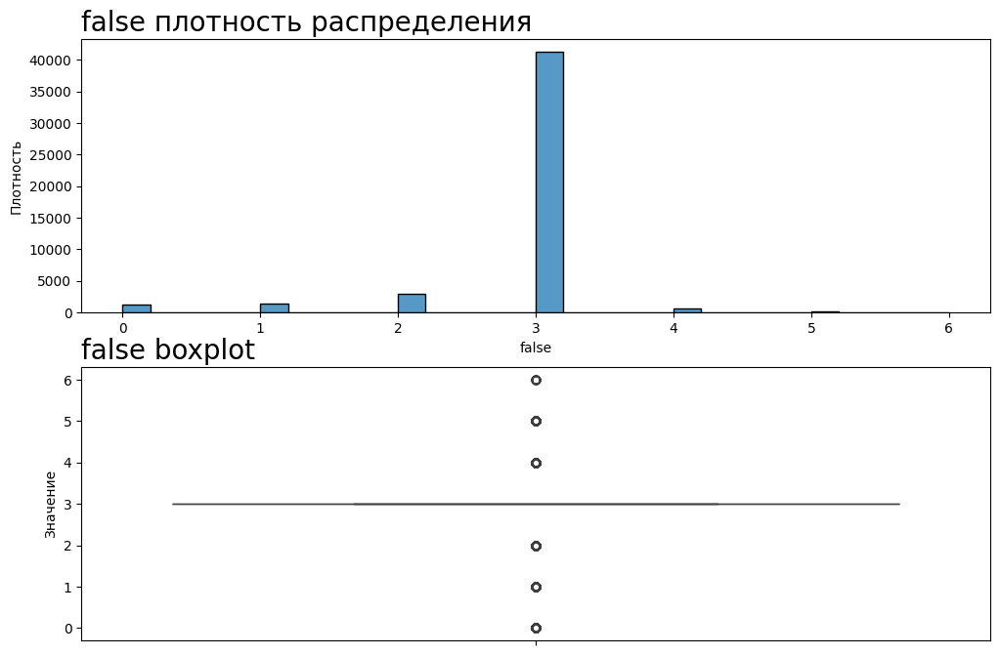

In [ ]:
# выделим чмисловые признаки
num_cols = df_crowd.select_dtypes(exclude='object').columns.tolist()

# построим граффики
for col in df_crowd[num_cols]:
    show_num_features(df_crowd[col], col, num_bins=30)

__Вывод:__ Дубликаты отсутствуют. В датасете 47829 строи и 5 столбцов. В 8 раз больше строк, чем в экспертных оценках. Пропуска отсутствуют

### Соединим вместе датасеты с оценками

In [ ]:
df_crowd.head(3)

,image,query_id,target,true,false
0,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
1,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3


In [ ]:
df_expert_result.head(3)

,image,query_id,result_grade
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0
1,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.3


In [ ]:
df_grade = pd.merge(df_expert_result, df_crowd, how='outer', on=['image', 'query_id'])
df_grade = df_grade.drop(['true',	'false'], axis=1)

In [ ]:
# агригируем вместе оценку экспертов и людей
def score_aggregate(row) -> object:
    if np.isnan(row['result_grade']):
        row['score'] = row['target']
    elif np.isnan(row['target']):
        row['score'] = row['result_grade']
    else:
        row['score'] = row['result_grade'] * 0.7 + row['target'] * 0.3
    return row

In [ ]:

df_grade = df_grade.apply(score_aggregate, axis=1)

In [ ]:
info(df_grade)

,image,query_id,result_grade,target,score
46867,452419961_6d42ab7000.jpg,3192266178_f9bf5d3dba.jpg#2,NaN,0.000000,0.000000
29135,3108732084_565b423162.jpg,3223055565_68973f5d20.jpg#2,NaN,0.000000,0.000000
46874,460935487_75b2da7854.jpg,1517721825_10176d0683.jpg#2,NaN,0.000000,0.000000
5410,534875358_6ea30d3091.jpg,3393926562_66cc01b001.jpg#2,0.0,NaN,0.000000
27669,3040033126_9f4b88261b.jpg,2847615962_c330bded6e.jpg#2,NaN,0.000000,0.000000
27546,302983277_69a4e732e4.jpg,2176980976_7054c99621.jpg#2,NaN,0.333333,0.333333
15978,241347204_007d83e252.jpg,3424424006_98f9d1921c.jpg#2,NaN,0.000000,0.000000
2451,2910758605_73a3f5a5c2.jpg,3259666643_ae49524c81.jpg#2,0.0,NaN,0.000000
26585,2991575785_bd4868e215.jpg,1332722096_1e3de8ae70.jpg#2,NaN,0.400000,0.400000
47134,468310111_d9396abcbd.jpg,2112921744_92bf706805.jpg#2,NaN,0.000000,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51267 entries, 0 to 51266
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         51267 non-null  object 
 1   query_id      51267 non-null  object 
 2   result_grade  5695 non-null   float64
 3   target        47829 non-null  float64
 4   score         51267 non-null  float64
dtypes: float64(3), object(2)
memory usage: 2.0+ MB


None

,count,mean,std,min,25%,50%,75%,max
result_grade,5695.0,0.188938,0.273448,0.0,0.0,0.0,0.3,1.0
target,47829.0,0.068766,0.207490,0.0,0.0,0.0,0.0,1.0
score,51267.0,0.074054,0.206269,0.0,0.0,0.0,0.0,1.0


Количесвто дубликатов:  0
Количесвто строк:  51267 Количесвто столбцов:  5


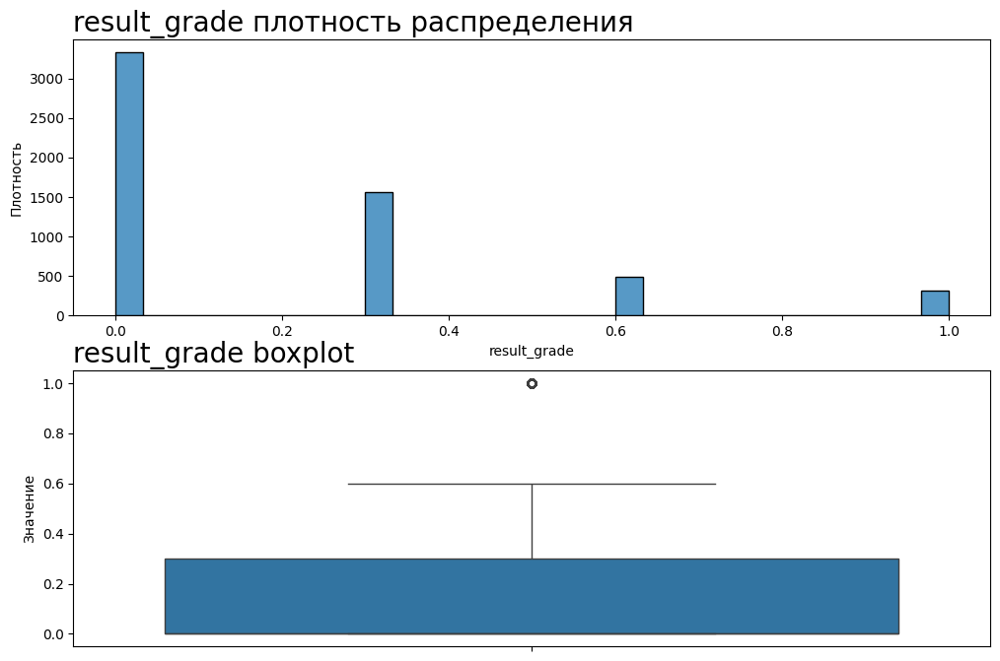

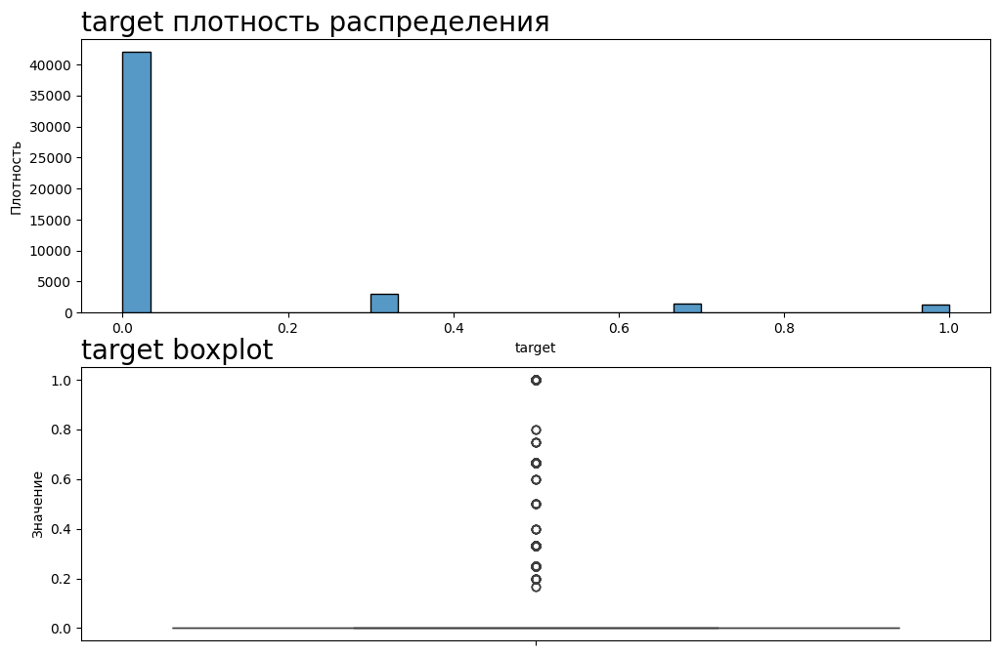

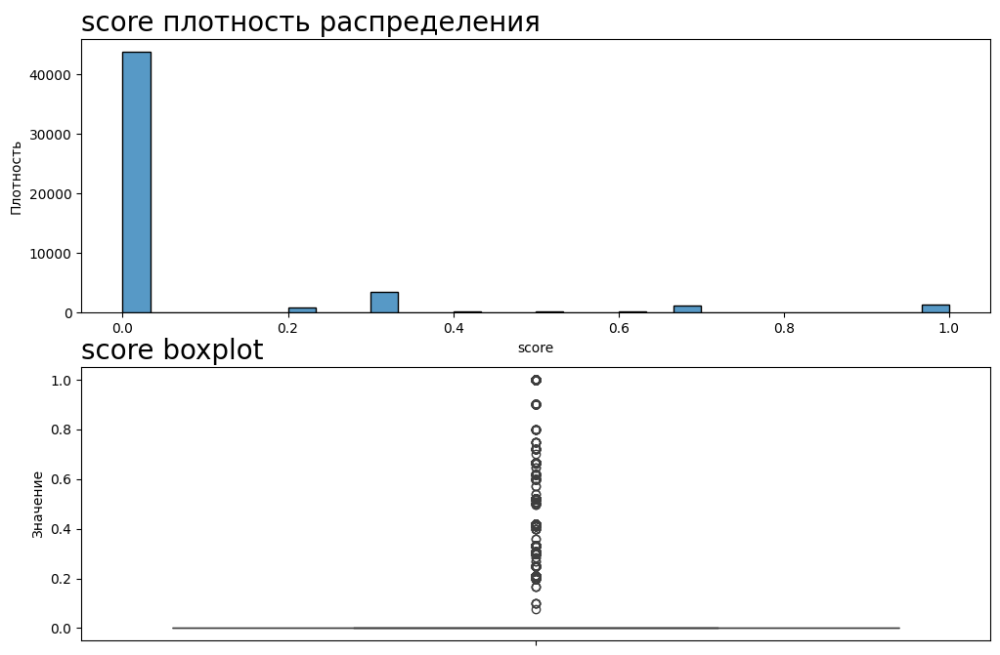

In [ ]:
# выделим чмисловые признаки
num_cols = df_grade.select_dtypes(exclude='object').columns.tolist()

# построим граффики
for col in df_grade[num_cols]:
    show_num_features(df_grade[col], col, num_bins=30)

__Вывод:__ Оценки в основном около 0.

### Тренировочный датасет с текстом

In [ ]:
train_datasets = pd.read_csv('/content/drive/MyDrive/sborniy_4/to_upload/train_dataset.csv')

In [ ]:
info(train_datasets)

,image,query_id,query_text
4432,3286822339_5535af6b93.jpg,3159995270_17334ccb5b.jpg#2,A woman skiing
2097,1408958345_68eea9a4e4.jpg,260828892_7925d27865.jpg#2,A person walks along the beach and leaves foot...
4366,2239938351_43c73c887c.jpg,1267711451_e2a754b4f8.jpg#2,a black and white dog walking through the gras...
1986,1808370027_2088394eb4.jpg,3506560025_8d0f4f9ac4.jpg#2,A woman holding a camera .
1810,293879742_5fe0ffd894.jpg,293881927_ac62900fd4.jpg#2,The dog is on the fence
2522,3461041826_0e24cdf597.jpg,3498327617_d2e3db3ee3.jpg#2,a grey dog swimming through a river with a sti...
269,1107246521_d16a476380.jpg,3365783912_e12c3510d8.jpg#2,Two men walk through a city with words on the ...
1900,2844018783_524b08e5aa.jpg,435827376_4384c3005a.jpg#2,"A man and a woman walking down a street , carr..."
1445,3350786891_6d39b234e9.jpg,3605061440_1d08c80a57.jpg#2,A group of children gather around a white dog ...
5524,3125309108_1011486589.jpg,537559285_29be110134.jpg#2,Collie jumping over a training hurdle that is ...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None

,count,unique,top,freq
image,5822,1000,3364151356_eecd07a23e.jpg,10
query_id,5822,977,2600867924_cd502fc911.jpg#2,34
query_text,5822,977,"Two dogs , one brown and white and one black a...",34


Количесвто дубликатов:  0
Количесвто строк:  5822 Количесвто столбцов:  3


In [ ]:
# соединим датасет с оценками
df_train = pd.merge(train_datasets, df_grade, how='outer', on=['image', 'query_id'])


In [ ]:
df_train =  df_train.drop(['result_grade', 'target'], axis=1)

In [ ]:
info(df_train)

,image,query_id,query_text,score
38608,3462454965_a481809cea.jpg,2922973230_5a769ef92a.jpg#2,NaN,0.000000
12564,2189995738_352607a63b.jpg,3701291852_373ea46bb6.jpg#2,NaN,0.000000
27421,3019842612_8501c1791e.jpg,1394368714_3bc7c19969.jpg#2,NaN,0.000000
33604,3251976937_20625dc2b8.jpg,3673165148_67f217064f.jpg#2,NaN,0.000000
29399,311146855_0b65fdb169.jpg,421322723_3470543368.jpg#2,NaN,0.000000
14788,2310126952_7dc86d88f6.jpg,3472364264_dbde5a8d0a.jpg#2,NaN,0.000000
26947,300314926_0b2e4b64f5.jpg,2541104331_a2d65cfa54.jpg#2,NaN,0.000000
19868,2594042571_2e4666507e.jpg,757046028_ff5999f91b.jpg#2,NaN,0.000000
8746,1490213660_9ea45550cf.jpg,2196846255_2c1635359a.jpg#2,NaN,0.666667
14,2616643090_4f2d2d1a44.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51322 entries, 0 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51322 non-null  object 
 1   query_id    51322 non-null  object 
 2   query_text  5822 non-null   object 
 3   score       51267 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


None

,count,mean,std,min,25%,50%,75%,max
score,51267.0,0.074054,0.206269,0.0,0.0,0.0,0.0,1.0


Количесвто дубликатов:  0
Количесвто строк:  51322 Количесвто столбцов:  4


In [ ]:
with_text = df_train[df_train['query_text'].notna()]

In [ ]:
with_text.head()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.21
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.00
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00


In [ ]:
#  функция заполняет пропуски текстов в тренировочных данных
def make_text(row):
    if pd.isnull(row['query_text']):
        texts = with_text[with_text['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]
    return row

In [ ]:
df_train = df_train.apply(make_text, axis=1)

In [ ]:
info(df_train)

,image,query_id,query_text,score
29981,3138399980_d6ab8b2272.jpg,2431470169_0eeba7d602.jpg#2,Man reading a newspaper at an outdoors restaur...,0.000000
31988,3216926094_bc975e84b9.jpg,263854883_0f320c1562.jpg#2,Two small dogs run through the grass .,0.000000
31109,3181701312_70a379ab6e.jpg,430173345_86388d8822.jpg#2,A brown dog with a purple Frisbee in its mouth .,0.000000
36628,3387542157_81bfd00072.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.000000
20659,2631300484_be8621d17b.jpg,488408004_a1e26d4886.jpg#2,A young boy wearing a light blue jacket walks ...,0.000000
17077,246055693_ccb69ac5c6.jpg,3285993030_87b0f1d202.jpg#2,A curly clack dog is running down a natural pa...,0.000000
12191,2160266952_a2ab39191b.jpg,3503623999_bbd5dcfb18.jpg#2,A woman wearing a hat and red scarf stands amo...,0.000000
2888,3223224391_be50bf4f43.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a...",0.210000
21410,2667015110_1670324a33.jpg,1237985362_dbafc59280.jpg#2,A woman with holding a young girl playing with...,0.000000
36199,3364151356_eecd07a23e.jpg,317109978_cb557802e1.jpg#2,A brown dog hops over a fallen tree branch .,0.333333


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51322 entries, 0 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51322 non-null  object 
 1   query_id    51322 non-null  object 
 2   query_text  50213 non-null  object 
 3   score       51267 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


None

,count,mean,std,min,25%,50%,75%,max
score,51267.0,0.074054,0.206269,0.0,0.0,0.0,0.0,1.0


Количесвто дубликатов:  0
Количесвто строк:  51322 Количесвто столбцов:  4


После объединения оказалось, что для некоторых изображений нет описание. Удалим их.

In [ ]:
df_train.dropna(inplace=True)
info(df_train)

,image,query_id,query_text,score
17562,247704641_d883902277.jpg,2869491449_1041485a6b.jpg#2,two dogs play together .,0.000000
49965,700884207_d3ec546494.jpg,2909875716_25c8652614.jpg#2,A woman in a field enjoys her clothing being b...,0.000000
4024,3179336562_c3d0c0a3bd.jpg,2739331794_4ae78f69a0.jpg#2,A motorcyclist races around a track .,0.000000
2770,3457045393_2bbbb4e941.jpg,3627011534_485f667b10.jpg#2,A young girl is wearing a purple shirt and pin...,0.210000
11506,2101457132_69c950bc45.jpg,2496370758_a3fbc49837.jpg#2,Two dogs bound across the grass .,0.000000
6131,1119015538_e8e796281e.jpg,2410320522_d967f0b75c.jpg#2,Large dog plays with two smaller dogs on grass .,0.000000
4505,2868575889_2c030aa8ae.jpg,2443380641_7b38d18f5b.jpg#2,A young boy is getting ready to hit a baseball .,0.000000
1490,2445283938_ff477c7952.jpg,522063319_33827f1627.jpg#2,Two children kneeling down with pirate hats on,0.300000
26423,2953015871_cae796b6e7.jpg,2869491449_1041485a6b.jpg#2,two dogs play together .,0.333333
21609,2682382530_f9f8fd1e89.jpg,3238951136_2a99f1a1a8.jpg#2,A man wearing red shorts is holding onto the r...,0.000000


<class 'pandas.core.frame.DataFrame'>
Index: 50158 entries, 0 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50158 non-null  object 
 1   query_id    50158 non-null  object 
 2   query_text  50158 non-null  object 
 3   score       50158 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


None

,count,mean,std,min,25%,50%,75%,max
score,50158.0,0.074898,0.207181,0.0,0.0,0.0,0.0,1.0


Количесвто дубликатов:  0
Количесвто строк:  50158 Количесвто столбцов:  4


### Тестовый датасет с названием изображений

In [ ]:
test_images = pd.read_csv('/content/drive/MyDrive/sborniy_4/to_upload/test_images.csv')

In [ ]:
info(test_images)

,image
88,3262849619_0bc4f88ef9.jpg
35,3033612929_764d977bd5.jpg
50,2399551242_c62a46dd5f.jpg
80,1991806812_065f747689.jpg
12,2885891981_6b02620ae9.jpg
68,957682378_46c3b07bcd.jpg
2,3089107423_81a24eaf18.jpg
63,191003283_992257f835.jpg
27,3287969199_08e775d896.jpg
39,381514859_b40418d9c3.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


None

,count,unique,top,freq
image,100,100,3356748019_2251399314.jpg,1


Количесвто дубликатов:  0
Количесвто строк:  100 Количесвто столбцов:  1


### Тестовый датасет с описание изображений

In [ ]:
test_queries = pd.read_csv('/content/drive/MyDrive/sborniy_4/to_upload/test_queries.csv', sep='|')

In [ ]:
info(test_queries)

,Unnamed: 0,query_id,query_text,image
231,231,3119913014_688d4997d7.jpg#1,A man is standing with his arms spread wide an...,3119913014_688d4997d7.jpg
483,483,957682378_46c3b07bcd.jpg#3,Two dogs are wrestling in a field .,957682378_46c3b07bcd.jpg
307,307,3386953179_84c2d7922f.jpg#2,A snowboarder wearing a red jacket is going do...,3386953179_84c2d7922f.jpg
150,150,2687672606_275169c35d.jpg#0,A girl with Indian clothing on and henna on he...,2687672606_275169c35d.jpg
196,196,3030079705_0dee8a3e89.jpg#1,A little girl with her hands in the air is sit...,3030079705_0dee8a3e89.jpg
415,415,3722572342_6904d11d52.jpg#0,a red covered boat racing across the water,3722572342_6904d11d52.jpg
315,315,3396275223_ee080df8b5.jpg#0,A girl is wearing a purple sash and matching s...,3396275223_ee080df8b5.jpg
346,346,345785626_9fa59f38ce.jpg#1,A man sits on a hill overlooking the ocean .,345785626_9fa59f38ce.jpg
302,302,3356748019_2251399314.jpg#2,Three men form an arch during a BMX bike race ...,3356748019_2251399314.jpg
198,198,3030079705_0dee8a3e89.jpg#3,A small girl sitting on a man 's back .,3030079705_0dee8a3e89.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


None

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,500.0,249.5,144.481833,0.0,124.75,249.5,374.25,499.0


Количесвто дубликатов:  0
Количесвто строк:  500 Количесвто столбцов:  4


###  Тренировочные изображения

In [ ]:
# создадим датафрейм с именами изображений
df_img_train = pd.DataFrame(columns=['image'])

for root, dirs, files in os.walk(PATH_IMAGES_TRAIN):  # возвращает путь к каталогу, список имен подкаталогов и имен файлов
    data = [{ 'image': file} for file in files]
    df_img_train = pd.concat([df_img_train, pd.DataFrame(data)], ignore_index=True)

In [ ]:
print(info(df_img_train))

,image
761,3044746136_8b89da5f40.jpg
102,2718495608_d8533e3ac5.jpg
435,307327914_f98f576adb.jpg
642,2196316998_3b2d63f01f.jpg
663,3542484764_77d8920ec9.jpg
141,2054869561_ff723e9eab.jpg
477,2594902417_f65d8866a8.jpg
382,200771289_31902164a7.jpg
845,219070971_ae43410b9e.jpg
668,2525270674_4ab536e7ec.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1009 entries, 0 to 1008
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   1009 non-null   object
dtypes: object(1)
memory usage: 8.0+ KB


None

,count,unique,top,freq
image,1009,1009,2218609886_892dcd6915.jpg,1


Количесвто дубликатов:  0
Количесвто строк:  1009 Количесвто столбцов:  1
None


In [ ]:
sample_train = list(df_img_train['image'].sample(10))


In [ ]:
# функция для просмотра изображений
def show_images(path_image, sample):
    fig = plt.figure(figsize=(10,10))
    for i in range(10):
        fig.add_subplot(5, 5, i+1)
        image = Image.open(f'{path_image}/{sample[i]}')
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

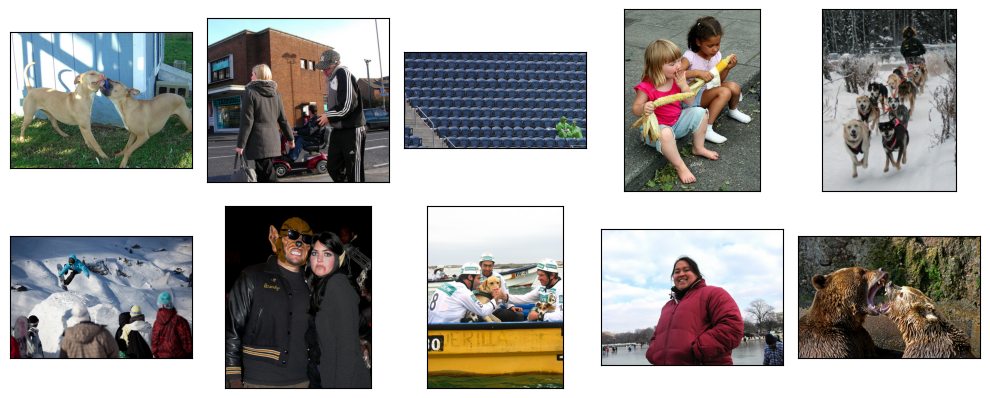

In [ ]:
show_images(PATH_IMAGES_TRAIN, sample_train)

## Тестовые изображения

In [ ]:
sample_test = list(test_images['image'].sample(10))

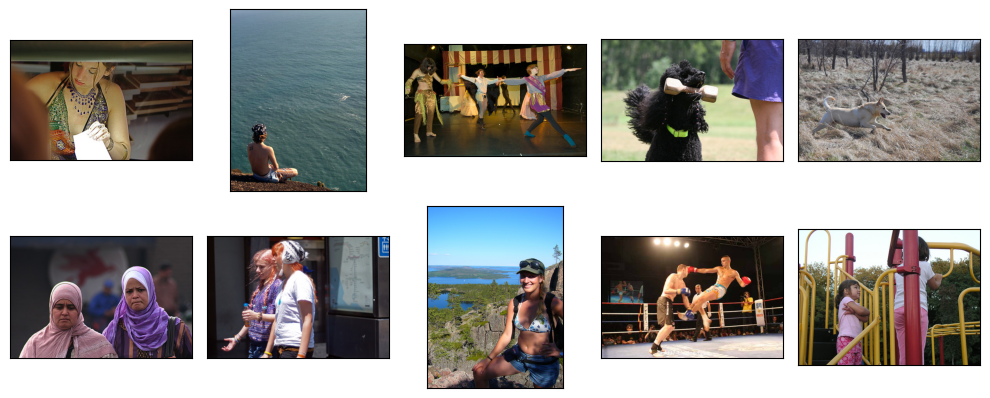

In [ ]:
show_images(PATH_IMAGES_TEST, sample_test)

__Вывод:__ 
1) Агрегировали оценки экспертов и фокусной группы.
2) Соединили оценки с тренировочной выборкой
3) И в тестовой и в тренировочной выборке присутствуют изображенря детей. Необходимо их удалить из выборки.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [ ]:
# Выполню очистку текста и лемматизирую его.
nlp = spacy.load('en_core_web_md')


def clean_text(sentence): # ф-я очистки текста
    sentence = re.sub('[^a-zA-Z]', ' ', sentence).lower()
    text = nltk.word_tokenize(sentence, language='english')
    return sentence

def lemmtext(text): # ф-я лемметезации текста
    doc = nlp(text)

    return ' '.join([token.lemma_ for token in doc])

In [ ]:
tqdm.pandas()
df_train['clean_text'] = df_train['query_text'].progress_apply(clean_text) # очистка текста для train

  0%|          | 0/50158 [00:00<?, ?it/s]

In [ ]:
tqdm.pandas()
df_train['lemm_text'] = df_train['clean_text'].progress_apply(lemmtext) # лемм. текста для train

  0%|          | 0/50158 [00:00<?, ?it/s]

In [ ]:
# отмечаем тексты для блокирования
df_train['to_block'] = df_train['lemm_text'].progress_apply(
    lambda x: 1 if [i for i in x.split() if i in BLOCK] else 0
)

  0%|          | 0/50158 [00:00<?, ?it/s]

In [ ]:
df_train['to_block'].sum()

14146

In [ ]:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['A little boy is jumping out of the pool .'
 'A child doing a handstand on the beach .'
 'A little girl wearing sunglasses puts her feet into the kitchen sink .'
 'The girl is standing as the other girl with glasses works on her hand painting .'
 'Two redheaded boys in brown shirts stand on a table and are fighting with sticks .'
 'Two children playing with a ball on the grass .'
 'Two small children are twirling sparkling rope .'
 'A man balances on his forearms while a child watches in front of a colorful background .'
 'a man holding a young boy on his shoulder .'
 'a little boy at the beach with a surfboard']


__Вывод:__ Отмечены тесты про детей

In [ ]:
mask = (df_train['query_text']
        .apply(lambda query: any(word in query.lower() for word in BLOCK)))

In [ ]:
mask

0         True
1         True
2         True
3         True
4         True
         ...  
51317     True
51318    False
51319    False
51320    False
51321    False
Name: query_text, Length: 50158, dtype: bool

In [ ]:
img_to_remove = df_train[mask]['query_id'].apply(lambda x: x[:-2]).unique()

In [ ]:
# удалим такие изображения
size_df = df_train.shape[0]
df_train = df_train[~df_train['image'].isin(img_to_remove)]
print(f'Удалено {size_df - df_train.shape[0]} изображений')
print('Размер датасета', df_train.shape[0])

Удалено 14344 изображений
Размер датасета 35814


__Вывод:__ Удалено 14344 изображений с детьми. Размер датасета после удаления 35814 строки.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [ ]:
image_to_vec = df_train['image'].unique()

In [ ]:
image_to_vec.shape

(709,)

In [ ]:
df_image_to_vec = pd.DataFrame(data=image_to_vec, columns=['image'])

In [ ]:
# датафрейм с именами изображений
print(df_image_to_vec.sample(3))
print(df_image_to_vec.shape)

                         image
626  2943023421_e297f05e11.jpg
149  2280525192_81911f2b00.jpg
248  3040033126_9f4b88261b.jpg
(709, 1)


In [ ]:
# Конвейер для препроцессинга изображений
preproc = transforms.Compose([
                              transforms.Resize(IMG_SIDE_RESIZE),
                              transforms.CenterCrop(IMG_SIDE_CROP),
                              transforms.ToTensor(),
                              transforms.Normalize(mean=NORMALIZE_MEAN, std=NORMALIZE_STD),
                             ])

In [ ]:
# Модель для векторизации изображений
model_image_vector = resnet50(weights=ResNet50_Weights.DEFAULT)             # предобученная модель resnet50

for param in model_image_vector.parameters():                               # 'заморозка' весов
    param.requires_grad_(False)

layers = list(model_image_vector.children())[:-1]                           # удаление [последнего] слоя для классификации
model_image_vector = nn.Sequential(*layers)                                 # создание модели без слоя для классификации

model_image_vector.eval();

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 155MB/s]


In [ ]:
def get_image_vector(val):
    img = Image.open(path+val['image']).convert('RGB')
    image_tensor = preproc(img)
    output_tensor = model_image_vector(image_tensor.unsqueeze(0)).flatten()
    return output_tensor.numpy()

In [ ]:
path = os.path.join(PATH + '/train_images/')

In [ ]:
%time
# Создание массива эмбеддингов
image_vector = df_image_to_vec.apply(get_image_vector, axis=1)
image_vector_array = np.vstack(image_vector)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.2 µs


In [ ]:
# векторы изображений
print(image_vector_array)

[[0.6736811  0.01235946 0.         ... 0.12612927 0.00444021 0.        ]
 [0.12005471 0.         0.         ... 0.6508879  0.73775357 0.03097239]
 [0.         0.         0.         ... 0.00526644 0.46694043 0.00469614]
 ...
 [0.         0.         0.         ... 0.         0.5276874  0.08821446]
 [0.07245272 0.         0.01447258 ... 0.         0.1316825  0.30851555]
 [0.00223123 0.         0.         ... 0.         0.         0.        ]]


In [ ]:
print('Размерность векторов: ', image_vector_array.shape)

Размерность векторов:  (709, 2048)


__Вывод:__  Получили эмбеддинги изображений. Размерность полученых эмбеддингов (709, 2048).

## 4. Векторизация текстов

Подготовьте данные для обучения: векторизуем тексты.

In [ ]:
%%time
# инициируем токинезатор, как обьект класса BertTokenizer и передадим словарь для обучения
#tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')
#model = AutoModel.from_pretrained('bert-base-uncased')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.29 µs


In [ ]:
#text = list(df_train['query_text'].drop_duplicates()) # удалим дубли запросы

In [ ]:
# создадим датафрейм с уникальными запросами
#df_text_to_vec = pd.DataFrame(data=text, columns=['query_text'])

In [ ]:
#print(df_text_to_vec.head())
#print(df_text_to_vec.shape)

In [ ]:
%%time
# преобразуем текста в номера токенов
#tokenized = df_text_to_vec['query_text'].apply(
    #lambda x: tokenizer.encode(x, add_special_tokens=True,  truncation=True, max_length=512))

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 5.96 µs


In [ ]:
# посчитаем самый длинный вектор
#max_len = 0
#for i in tokenized.values:
    #if len(i) > max_len:
        #max_len = len(i)

# заполняем 0-ми оставшиеся векторы, что бы длинна исходных текстов была равной
#padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])

In [ ]:
# создадим маску, которая пояснит модели, что 0 не несет полезной информации
#attention_mask = np.where(padded != 0, 1, 0)

In [ ]:
# проверим размерность маски
#print(attention_mask.shape)

In [ ]:
%%time
# создадим эмбединги
#batch_size = 100
#embeddings = []
#for i in notebook.tqdm(range(padded.shape[0] // batch_size)):
        #batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        #attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])

        #with torch.no_grad():
            #batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        #embeddings.append(batch_embeddings[0].numpy())

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs


In [ ]:
# запишем вектор признака в переменную
#text_emb_bert = np.concatenate(embeddings)

In [ ]:
# посмотрим на размерность
#print(text_emb_bert.shape)

In [ ]:
# преобрфзуем размерность в двумерную
#nsamples, nx, ny = text_emb_bert.shape
#text_emb_bert = text_emb_bert.reshape((nsamples,nx*ny))

In [ ]:
#print(text_emb_bert.shape)

Слишком большая размерномсь эмбеддингов (900, 27648). Попробую другой код.

In [ ]:
text = list(df_train['query_text'].drop_duplicates()) # удалим дубли запросы

In [ ]:
# создадим датафрейм с уникальными запросами
df_text_to_vec = pd.DataFrame(data=text, columns=['query_text'])

In [ ]:
print(df_text_to_vec.head())
print(df_text_to_vec.shape)

                                          query_text
0  A young child is wearing blue goggles and sitt...
1  A girl wearing a yellow shirt and sunglasses s...
2    A man sleeps under a blanket on a city street .
3  A woman plays with long red ribbons in an empt...
4         Chinese market street in the winter time .
(977, 1)


In [ ]:
%%time
# инициируем токинезатор, как обьект класса BertTokenizer и передадим словарь для обучения
tokenizer = AutoTokenizer.from_pretrained('google-bert/bert-base-uncased')
model = AutoModel.from_pretrained('google-bert/bert-base-uncased')

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

CPU times: user 1.03 s, sys: 1.05 s, total: 2.08 s
Wall time: 7.22 s


In [ ]:
# извлечем эмбеддинги для запросов
def create_emb_text(data):
    if isinstance(data, str):
        encoded_input = tokenizer(
            data, padding=True, truncation=True,
            max_length=128, return_tensors='pt'
        )

        with torch.no_grad():
            model_output = model(**encoded_input)

        token_embeddings = model_output[0]
        attention_mask = encoded_input['attention_mask']
        input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
        sum_embeddings = torch.sum(token_embeddings * input_mask_expanded, 1)
        sum_mask = torch.clamp(input_mask_expanded.sum(1), min=1e-9)

        return (sum_embeddings / sum_mask).numpy()

    else:
        tokenized = data.apply(
            lambda x: tokenizer.encode(x,
                                       add_special_tokens=True,
                                       truncation=True,
                                       max_length=128,
                                       )
        )

        max_len = max([len(x) for x in tokenized])
        padded = np.array([i + [0] * (max_len - len(i)) for i in tokenized.values])
        attention_mask = np.where(padded != 0, 1, 0)

        batch_size = 32
        embeddings = []

        for i in tqdm(range(padded.shape[0] // batch_size + 1)):
            batch = torch.LongTensor(padded[batch_size * i : batch_size * (i + 1)])
            attention_mask_batch = torch.LongTensor(
                attention_mask[batch_size * i : batch_size * (i + 1)]
            )

            with torch.no_grad():
                batch_embeddings = model(batch, attention_mask=attention_mask_batch)
            embeddings.append(batch_embeddings[0][:,0,:].numpy())

        return embeddings

In [ ]:
# запишем вектор признака в переменную
emb = create_emb_text(df_text_to_vec['query_text'])

  0%|          | 0/31 [00:00<?, ?it/s]

In [ ]:
# запишем вектор признака в переменную
text_emb_bert = np.concatenate(emb)

In [ ]:
print('Размерность эмбеддингов для запросов: ', text_emb_bert.shape)

Размерность эмбеддингов для запросов:  (977, 768)


__Вывод:__ Получили эмбеддинги заспросв с помощью модели Bert

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [ ]:
# запишим эмбеддинги изображений в датафрейм
image_embedings = pd.DataFrame(image_vector_array)

In [ ]:
# добавим название изображений
image_embedings['image'] = df_train.drop_duplicates('image').reset_index(drop=True)['image']

In [ ]:
#image_embedings.head()

In [ ]:
# запишем эмбеддинги запросов в датафрейм
text_embeddings = pd.DataFrame(text_emb_bert)

In [ ]:
# добавим название запросов
text_embeddings['query_id'] = (df_train.drop_duplicates('query_text').reset_index(drop=True)['query_id'])

In [ ]:
#text_embeddings.head()

In [ ]:
# добавим эмбеддинги в обучающую выборку
df_train = (df_train
         .merge(image_embedings,
                how = 'left',
                on='image')
         .merge(text_embeddings,
                'left',
                on='query_id')
        )

In [ ]:
info(df_train)

,image,query_id,query_text,score,clean_text,lemm_text,to_block,0_x,1_x,2_x,...,758_y,759_y,760_y,761_y,762_y,763_y,764_y,765_y,766_y,767_y
28696,3545586120_283d728a97.jpg,3110649716_c17e14670e.jpg#2,A man is tying a red arm band around another m...,0.000000,a man is tying a red arm band around another m...,a man be tie a red arm band around another man...,0,0.036478,0.0,0.000000,...,-0.384121,0.263672,-0.088010,-0.093924,0.034801,0.794246,0.146628,-0.031479,0.262674,0.414820
22632,324208502_674488bcea.jpg,3110649716_c17e14670e.jpg#2,A man is tying a red arm band around another m...,0.000000,a man is tying a red arm band around another m...,a man be tie a red arm band around another man...,0,0.008503,0.0,0.664505,...,-0.384121,0.263672,-0.088010,-0.093924,0.034801,0.794246,0.146628,-0.031479,0.262674,0.414820
27991,3518126579_e70e0cbb2b.jpg,1432179046_8e3d75cf81.jpg#2,A man walks toward a car in a parking lot .,0.000000,a man walks toward a car in a parking lot,a man walk toward a car in a parking lot,0,0.197809,0.0,0.419749,...,-0.338495,0.316922,-0.005362,-0.259130,-0.068139,1.052794,-0.000987,0.001144,-0.014764,0.299674
22425,3228069008_edb2961fc4.jpg,1392272228_cf104086e6.jpg#2,A black dog is coming out of the ocean water o...,0.000000,a black dog is coming out of the ocean water o...,a black dog be come out of the ocean water on ...,0,0.389891,0.0,0.273990,...,-0.278295,0.182008,-0.230049,-0.084329,-0.020390,0.619914,0.024970,-0.110899,0.258271,0.375028
3628,3323988406_e3c8fce690.jpg,747921928_48eb02aab2.jpg#2,A child holds sparklers in the dark .,0.000000,a child holds sparklers in the dark,a child hold sparkler in the dark,1,0.097824,0.0,0.035369,...,0.102678,0.066786,-0.138650,0.457620,0.343273,0.354919,0.082108,-0.219179,0.144686,0.367103
27025,3473264983_67917a931f.jpg,160792599_6a7ec52516.jpg#2,Five people standing in front of a body of wat...,0.000000,five people standing in front of a body of wat...,five people stand in front of a body of water,0,0.000348,0.0,0.040527,...,-0.092410,-0.457995,-0.405307,-0.363889,0.330320,0.251376,-0.274512,-0.145131,0.316766,0.018943
22944,3255482333_5bcee79f7e.jpg,2100816230_ff866fb352.jpg#2,A man jumps while snow skiing .,0.000000,a man jumps while snow skiing,a man jump while snow skiing,0,0.129743,0.0,0.000000,...,-0.113527,-0.174970,-0.143911,0.176753,0.474789,1.139080,0.489203,-0.483015,0.148432,0.160678
1339,3472364264_dbde5a8d0a.jpg,359837950_9e22ffe6c2.jpg#2,A black dog walking along a rocky terrain .,0.333333,a black dog walking along a rocky terrain,a black dog walk along a rocky terrain,0,0.116252,0.0,0.000000,...,0.021727,-0.034683,-0.213820,-0.143653,0.263466,0.075289,-0.141958,-0.286881,0.288539,0.142181
33782,488590040_35a3e96c89.jpg,2729655904_1dd01922fb.jpg#2,Two boys play with two dogs at the shore .,0.000000,two boys play with two dogs at the shore,two boy play with two dog at the shore,1,0.064876,0.0,0.000000,...,0.094241,-0.056799,-0.203939,0.104776,-0.009419,0.729847,0.287882,-0.231123,0.185002,0.061983
16199,2893374123_087f98d58a.jpg,3061481868_d1e00b1f2e.jpg#2,Two people on a motorcycle .,0.333333,two people on a motorcycle,two people on a motorcycle,0,0.000000,0.0,0.000000,...,-0.128270,-0.166104,-0.333599,0.021538,-0.076918,-0.132201,-0.405449,-0.247122,0.406159,0.042824


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35814 entries, 0 to 35813
Columns: 2823 entries, image to 767_y
dtypes: float32(2816), float64(1), int64(1), object(5)
memory usage: 386.6+ MB


None

,count,mean,std,min,25%,50%,75%,max
score,35814.0,0.083711,0.217875,0.000000,0.000000,0.000000,0.000000,1.000000
to_block,35814.0,0.190624,0.392799,0.000000,0.000000,0.000000,0.000000,1.000000
0_x,35814.0,0.132866,0.247233,0.000000,0.000000,0.026989,0.137975,1.734366
1_x,35814.0,0.009342,0.042971,0.000000,0.000000,0.000000,0.000000,0.750880
2_x,35814.0,0.072342,0.158826,0.000000,0.000000,0.006495,0.076491,1.884523
...,...,...,...,...,...,...,...,...
763_y,35814.0,0.507007,0.350712,-0.428928,0.228939,0.512843,0.772473,1.385451
764_y,35814.0,0.029247,0.282717,-0.876961,-0.136562,0.061566,0.234491,0.754558
765_y,35814.0,-0.195047,0.173216,-0.795783,-0.297218,-0.187205,-0.072091,0.395582
766_y,35814.0,0.278358,0.173722,-0.390726,0.167135,0.269810,0.389362,0.913408


Количесвто дубликатов:  0
Количесвто строк:  35814 Количесвто столбцов:  2823


__Вывод:__ Объединили эмбеддинги изображений и запросов. Подготовили данные для обучения модели.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

### Разделяем датасет на train и val

In [ ]:
df_train = df_train.reset_index(drop=True)

In [ ]:
df_train.head()

,image,query_id,query_text,score,clean_text,lemm_text,to_block,0_x,1_x,2_x,...,758_y,759_y,760_y,761_y,762_y,763_y,764_y,765_y,766_y,767_y
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,a young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...,1,0.673681,0.012359,0.000000,...,-0.365718,-0.110822,-0.342743,-0.105674,-0.026857,0.914323,0.18404,0.020952,0.323602,0.604957
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,a young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...,1,0.120055,0.000000,0.000000,...,-0.365718,-0.110822,-0.342743,-0.105674,-0.026857,0.914323,0.18404,0.020952,0.323602,0.604957
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,a young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...,1,0.000000,0.000000,0.000000,...,-0.365718,-0.110822,-0.342743,-0.105674,-0.026857,0.914323,0.18404,0.020952,0.323602,0.604957
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,a young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...,1,0.000000,0.000000,0.003804,...,-0.365718,-0.110822,-0.342743,-0.105674,-0.026857,0.914323,0.18404,0.020952,0.323602,0.604957
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,a young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...,1,0.267399,0.021823,0.339856,...,-0.365718,-0.110822,-0.342743,-0.105674,-0.026857,0.914323,0.18404,0.020952,0.323602,0.604957


In [ ]:
df_train = df_train.drop(['clean_text', 'lemm_text', 'to_block'], axis=1)

In [ ]:
#df_train.head()

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=SEED)

In [ ]:
train_indices,  valid_indices = next(gss.split(X=df_train.drop(columns=['image', 'query_id', 'query_text', 'score']), y=df_train['score'], groups=df_train['image']))

In [ ]:
# обучающие признаки
X_train = df_train.drop(columns=['score', 'image', 'query_id', 'query_text']).loc[train_indices]

In [ ]:
# валидационные признаки
X_val = df_train.drop(columns=['score', 'image', 'query_id', 'query_text']).loc[valid_indices]

In [ ]:
# таргет для выборок
y_train, y_val = df_train['score'].loc[train_indices], df_train['score'].loc[valid_indices]

In [ ]:
# посмотрим размерность
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(25021, 2816)
(25021,)
(10793, 2816)
(10793,)


### Стандартизируем данные

In [ ]:
X_train.columns = X_train.columns.astype(str)
X_val.columns = X_val.columns.astype(str)

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25021 entries, 0 to 35813
Columns: 2816 entries, 0_x to 767_y
dtypes: float32(2816)
memory usage: 269.0 MB


In [ ]:
scaler = StandardScaler()

In [ ]:
# Обучаем на train и трансформируем
X_train = scaler.fit_transform(X_train)

In [ ]:
X_val = scaler.transform(X_val)

### LinearRegression

В качестве метрики будем использовать RMSE. Эта метрика, в отличие от MSE, лучше интерпретируется. Так как мы демонтрируем модель заказчику, предполагаю что чем проше будет понять насколько ошибается модель, тем лучше.

In [ ]:
# обучим модель
model_lr = LinearRegression(n_jobs=-1)
model_lr.fit(X_train, y_train)

LinearRegression(n_jobs=-1)

In [ ]:
pred_val = model_lr.predict(X_val)

In [ ]:
rmse_lr = round(mean_squared_error(y_val, pred_val, squared=False), 2)

In [ ]:
print('RMSE на валидационной выборке с использованием модели LinearRegression: ', rmse_lr)

RMSE на валидационной выборке с использованием модели LinearRegression:  10695.57


### Полносвязная нейронная сеть

In [ ]:
X_train.shape

(25021, 2816)

In [ ]:
# создадим сеть
net = Sequential()
net.add(Dense(2816, input_shape=(2816,), activation='relu'))
net.add(BatchNormalization())
net.add(Dense(256, activation='relu'))
net.add(BatchNormalization())
net.add(Dense(64, activation='relu'))
net.add(BatchNormalization())
net.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

net.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

net.build()

net.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2816)              7932672   
                                                                 
 batch_normalization (Batch  (None, 2816)              11264     
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 256)               721152    
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                16448     
                                                                 
 batch_normalization_2 (Bat  (None, 64)                2

In [ ]:
%time
net.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=32, epochs=50,
    verbose=2, shuffle=True
    )

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.91 µs
Epoch 1/50
782/782 - 10s - loss: 0.0269 - root_mean_squared_error: 0.1639 - val_loss: 0.0575 - val_root_mean_squared_error: 0.2398 - 10s/epoch - 12ms/step
Epoch 2/50
782/782 - 8s - loss: 0.0254 - root_mean_squared_error: 0.1595 - val_loss: 0.0552 - val_root_mean_squared_error: 0.2349 - 8s/epoch - 11ms/step
Epoch 3/50
782/782 - 6s - loss: 0.0246 - root_mean_squared_error: 0.1568 - val_loss: 0.0550 - val_root_mean_squared_error: 0.2345 - 6s/epoch - 8ms/step
Epoch 4/50
782/782 - 6s - loss: 0.0233 - root_mean_squared_error: 0.1527 - val_loss: 0.0549 - val_root_mean_squared_error: 0.2342 - 6s/epoch - 8ms/step
Epoch 5/50
782/782 - 6s - loss: 0.0218 - root_mean_squared_error: 0.1476 - val_loss: 0.0548 - val_root_mean_squared_error: 0.2340 - 6s/epoch - 8ms/step
Epoch 6/50
782/782 - 6s - loss: 0.0217 - root_mean_squared_error: 0.1472 - val_loss: 0.0531 - val_root_mean_squared_error: 0.2305 - 6s/epoch - 7ms/step
Epoch 7/50
782/782 -

Epoch 50/50
782/782 - 6s - loss: 0.0096 - root_mean_squared_error: 0.0979 - val_loss: 0.0459 - val_root_mean_squared_error: 0.2143 - 6s/epoch - 8ms/step


__Вывод:__ 
1) Обучили две модели нейронную сеть и линейную регрессию.
2) Лучше всего себя показала нейронная сеть, удалось добиться метрики RMSE на валидационной выборке = 0.21. Будем использовать эту модель в дальнейшей работе.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [ ]:
path = os.path.join(PATH + '/test_images/')

In [ ]:
# получим эмбеддинги для тестовых изображений
image_test_vector = test_images.apply(get_image_vector, axis=1)

In [ ]:
image_vector_array = np.vstack(image_test_vector)

In [ ]:
print(image_vector_array.shape)

(100, 2048)


image_test_vector.head()

In [ ]:
# Функцию, принимающую на вход текстовое описание и возвращающую 5 картиной с максимальной предсказанной оценкой схожести.

def get_picture(text) -> None:
    if [i for i in lemmtext(text) if i in BLOCK]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = create_emb_text(text) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            image_vector_array,
            np.resize(text_embed, (image_vector_array.shape[0],768))),
            axis=1)
        #X = np.concatenate((
         #   test_foto_emb,
          #  np.resize(text_embed, (test_foto_emb.shape[0],768))),
           # axis=1)
        X = scaler.transform(X)
        predictions = net.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((test_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(f'{PATH_IMAGES_TEST}/{top[i]}')
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(test_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            #image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            pics = test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']
            image = Image.open(f'{PATH_IMAGES_TEST}/{pics}')
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

test_queries

In [ ]:
samples = test_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['A group of people perform together onstage .',
 'A young boy is holding a PlayStation controller over his head .',
 'a red covered boat racing across the water',
 'A Yorkie trying to catch a red toy .',
 'Two men are standing under what looks to be a giant robot .',
 'People in a tent shelter near the bottom of stairs .',
 'Grey horse wearing blue cover eating from a orange bucket held by a person in a green shirt .',
 'A boy on a BMX bike',
 'A woman and a young girl riding a sled down a snowy hill while standing .',
 'the man is wearing a backpack and sunglasses while walking through an outdoor market .']

4/4 [==============================] - 0s 3ms/step

-------------------- A group of people perform together onstage . --------------------



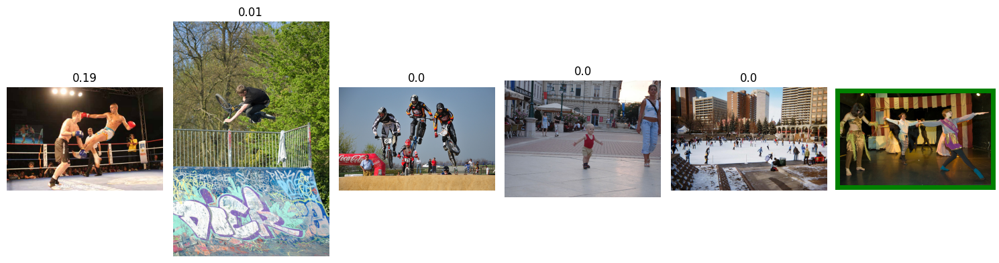

4/4 [==============================] - 0s 4ms/step

-------------------- A young boy is holding a PlayStation controller over his head . --------------------



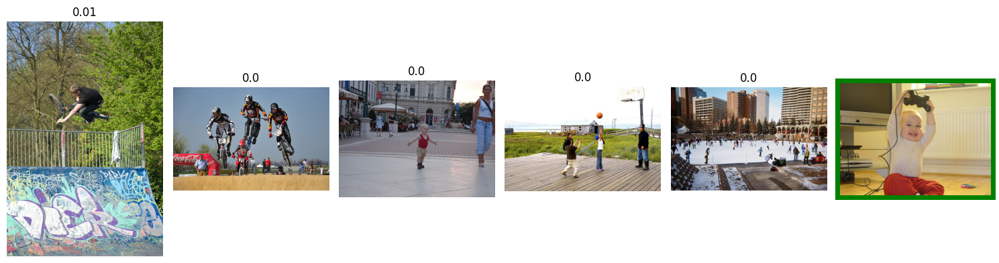

4/4 [==============================] - 0s 5ms/step

-------------------- a red covered boat racing across the water --------------------



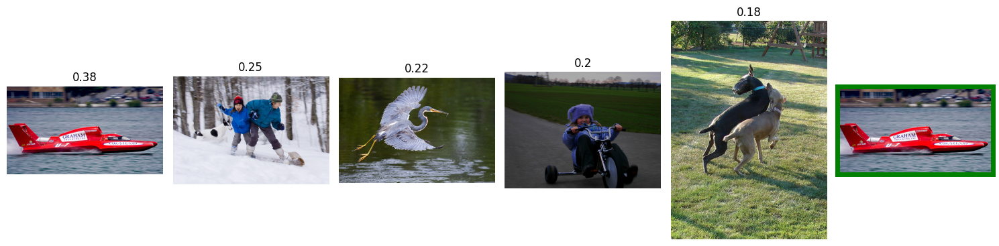

4/4 [==============================] - 0s 3ms/step

-------------------- A Yorkie trying to catch a red toy . --------------------



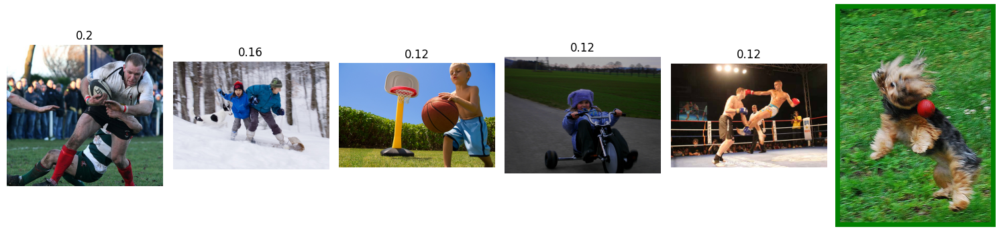

4/4 [==============================] - 0s 3ms/step

-------------------- Two men are standing under what looks to be a giant robot . --------------------



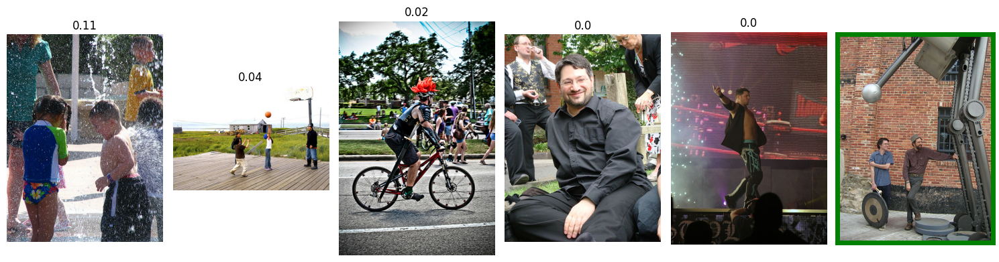

4/4 [==============================] - 0s 5ms/step

-------------------- People in a tent shelter near the bottom of stairs . --------------------



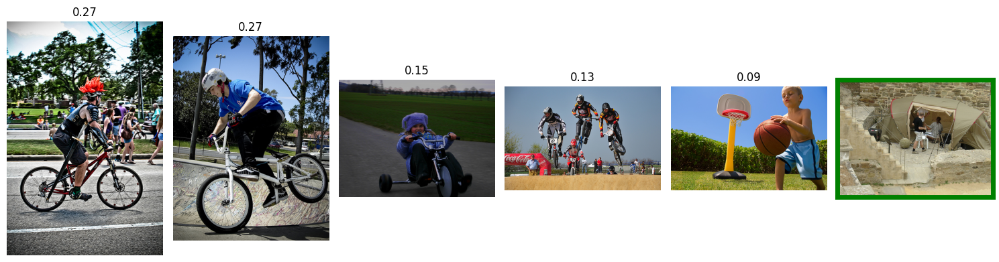

4/4 [==============================] - 0s 3ms/step

-------------------- Grey horse wearing blue cover eating from a orange bucket held by a person in a green shirt . --------------------



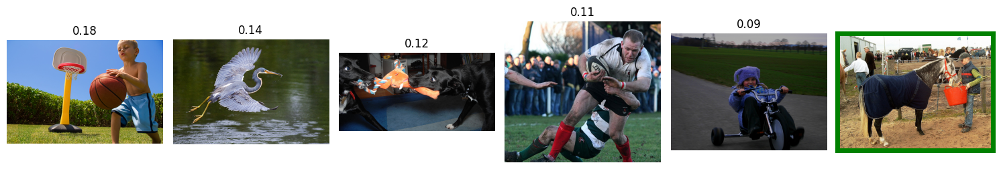

4/4 [==============================] - 0s 3ms/step

-------------------- A boy on a BMX bike --------------------



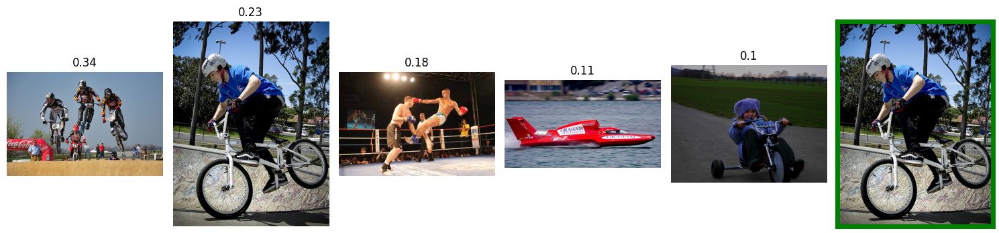

4/4 [==============================] - 0s 5ms/step

-------------------- A woman and a young girl riding a sled down a snowy hill while standing . --------------------



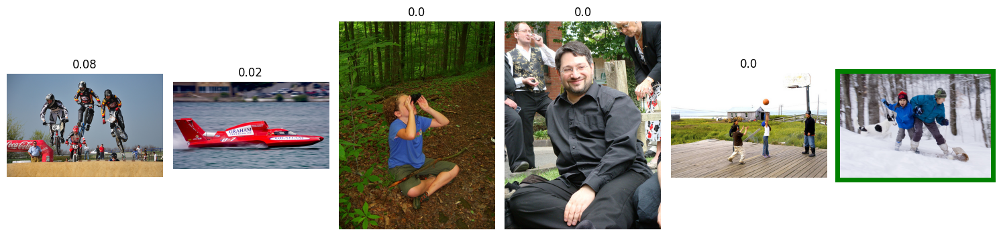

4/4 [==============================] - 0s 4ms/step

-------------------- the man is wearing a backpack and sunglasses while walking through an outdoor market . --------------------



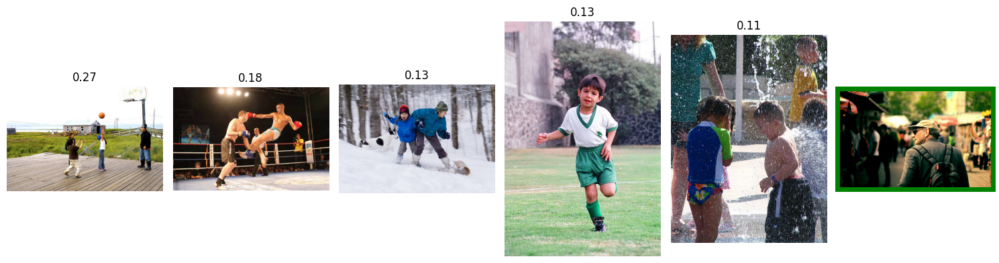

In [ ]:
for text in text_test:
    get_picture(text)

__Вывод:__ Модель работае на очень хорошо, видим что она все равно ошибается. 

## 8. Выводы

- Jupyter Notebook открыт
- Весь код выполняется без ошибок
- Ячейки с кодом расположены в порядке исполнения
- Исследовательский анализ данных выполнен
- Проверены экспертные оценки и краудсорсинговые оценки
- Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- Изображения векторизованы
- Текстовые запросы векторизованы
- Данные корректно разбиты на тренировочную и тестовую выборки
- Предложена метрика качества работы модели
- Предложена модель схожести изображений и текстового запроса
- Модель обучена
- По итогам обучения модели сделаны выводы
- Проведено тестирование работы модели
- По итогам тестирования визуально сравнили качество поиска

__Общий вывод:__

1) В данном проекте мы разрабатывали демонстрационную версию поиска изображений по запросу.

2) В ходе нашей работы мы очистили датасет от изображений детей, в рамках ограничения по обработке изображений.

3) Агрегировали оценки экспертов и фокус группы, относительно соответствия изображения запросу.

4) Разработали две модели LinearRegression и полносвязную нейронную сеть с 4-я слоями.

5) Лучше всего себы показала в работе нейронная сеть, на 50 эпохах удалось добиться метрики RMSE=0.21. И это не предел, предполагаю, что увеличения эпох поможет снизить метрику.

6) В конце работы мы сделали демонтрационную модели выбора изображений по запросу.

7) Наша демонтрационная модель работает удовлетворительно, в выборке всегда находится изображение, соответствующее запросу. Так как вопрос имеет узкую специализацию, в выборке за частую находится только одно одно изображение, полностью соответствующее запросу из топ 5. 